In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import datetime
import copy
import time

import sys
sys.path.append('../../')

from data.processing import get_data

import models

from main.seir.fitting import single_fitting_cycle
from main.seir.forecast import get_forecast, forecast_all_trials, create_all_trials_csv, create_decile_csv_new
from main.seir.sensitivity import calculate_sensitivity_and_plot
from utils.generic.create_report import save_dict_and_create_report
from utils.generic.config import read_config
from utils.generic.enums import Columns
from utils.fitting.loss import Loss_Calculator
#from utils.generic.logging import log_wandb
from viz import plot_forecast, plot_top_k_trials, plot_ptiles

import yaml

In [3]:
predictions_dict = {}

In [4]:
config_filename = 'uncer.yaml'
config = read_config(config_filename)

In [5]:
output_folder = '../../misc/reports/{}'.format(datetime.datetime.now().strftime("%Y_%m%d_%H%M%S"))

## Perform M1 and M2 fits

Performing m1 fit ..
loading from ../../misc/cache/dataframes_ts_13102020_tracker.pkl


/Users/avtansht/anaconda3/envs/C19M/lib/python3.8/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


171 171


  0%|          | 0/5000 [00:00<?, ?it/s]

Smoothing 7358 recovered between 2020-05-28 and 2020-04-26 (32) days in a weighted-mag manner
Smoothing 3139 recovered between 2020-06-14 and 2020-04-26 (49) days in a weighted-mag manner
Smoothing 917 deceased between 2020-06-15 and 2020-04-26 (50) days in a weighted-mag manner
Smoothing 2432 recovered between 2020-06-23 and 2020-06-15 (8) days in a weighted-mag manner
Smoothing 2141 recovered between 2020-06-24 and 2020-06-15 (9) days in a weighted-mag manner
Smoothing 5900 recovered between 2020-07-01 and 2020-05-28 (34) days in a weighted-mag manner

splitting data ..
splitting data ..
train
 +-------------+---------------------+---------------------+---------------------+---------------------+---------------------+
|             | 115                 | 116                 | 117                 | 118                 | 119                 |
|-------------+---------------------+---------------------+---------------------+---------------------+---------------------|
| date        | 20

  0%|          | 6/5000 [00:00<01:29, 56.02it/s]

1.128504434376852
4.3858115703311
3.119480329034596
23.593439201164344
22.66477936201843
0.012515318493939805
0.08922688203262315
0.6537669050384555
0.6609205930478684


  0%|          | 7/5000 [00:00<01:22, 60.78it/s]

0.9595640014958919
4.171702674504642
3.556327754335026
24.201999424034025
2.037696576116232
0.08909136719061457
0.6396967256399253
0.4408772128210078
0.13833010090835954


  0%|          | 5/5000 [00:00<01:52, 44.35it/s]

0.9644175381260385
4.511527784435533
3.4534523117704308
32.14185222773883
7.088645372427391
0.07454125287239521
0.6086933646373011
0.9008775619499811
0.7478393403655309


  0%|          | 6/5000 [00:00<01:29, 55.53it/s]

0.7771409446779804
4.171607517880521
3.6659693204319312
5.074160189205561
31.025565205609137
0.0175296251356062
0.5292158481654312
0.6213039640915397
0.9253996574586564


  1%|          | 7/1000 [00:00<00:14, 69.14it/s]

Gelman-Rubin convergence statistics (variance ratios):
{   'E_hosp_ratio': 1.7729175097561918,
    'I_hosp_ratio': 1.448144444083975,
    'P_fatal': 2.42267359342437,
    'T_inc': 2.516864891579232,
    'T_inf': 2.209039387386312,
    'T_recov': 93.09401294098754,
    'T_recov_fatal': 57.92218955823467,
    'lockdown_R0': 1.7943141333500254,
    'sigma': 1.4269846739161813}


100%|██████████| 1000/1000 [00:13<00:00, 74.11it/s]


best parameters
 OrderedDict([('lockdown_R0', 0.8247351541269645), ('T_inc', 4.3904818244022294), ('T_inf', 3.558476134453994), ('T_recov', 29.706983092008826), ('T_recov_fatal', 18.26790470610283), ('P_fatal', 0.0022056505312300855), ('E_hosp_ratio', 0.09750577967583637), ('I_hosp_ratio', 0.24624044705076506), ('sigma', 0.9049715217258546)])
Performing m2 fit ..
loading from ../../misc/cache/dataframes_ts_13102020_tracker.pkl


/Users/avtansht/anaconda3/envs/C19M/lib/python3.8/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


171 171
Smoothing 7358 recovered between 2020-05-28 and 2020-04-26 (32) days in a weighted-mag manner
Smoothing 3139 recovered between 2020-06-14 and 2020-04-26 (49) days in a weighted-mag manner
Smoothing 917 deceased between 2020-06-15 and 2020-04-26 (50) days in a weighted-mag manner
Smoothing 2432 recovered between 2020-06-23 and 2020-06-15 (8) days in a weighted-mag manner
Smoothing 2141 recovered between 2020-06-24 and 2020-06-15 (9) days in a weighted-mag manner
Smoothing 5900 recovered between 2020-07-01 and 2020-05-28 (34) days in a weighted-mag manner

splitting data ..
splitting data ..


  0%|          | 6/5000 [00:00<01:23, 59.99it/s]

train
 +-------------+---------------------+---------------------+---------------------+---------------------+---------------------+
|             | 122                 | 123                 | 124                 | 125                 | 126                 |
|-------------+---------------------+---------------------+---------------------+---------------------+---------------------|
| date        | 2020-08-27 00:00:00 | 2020-08-28 00:00:00 | 2020-08-29 00:00:00 | 2020-08-30 00:00:00 | 2020-08-31 00:00:00 |
| state       | Maharashtra         | Maharashtra         | Maharashtra         | Maharashtra         | Maharashtra         |
| district    | Mumbai              | Mumbai              | Mumbai              | Mumbai              | Mumbai              |
| total       | 140761.0            | 142005.14           | 143389.0            | 144626.0            | 145805.0            |
| active      | 19506.71            | 19836.29            | 20293.0             | 20648.0             | 20879.0

  0%|          | 5/5000 [00:00<01:44, 47.92it/s]

1.010545809431273
4.185042295450203
3.809903375916185
14.182934233558735
21.025481538869872
0.09990457533883255
1.5073526373457342
0.6084641805946819
0.1926670390220252


  0%|          | 6/5000 [00:00<01:35, 52.46it/s]

0.7999470952400647
4.114836332903025
3.977567429086874
36.62134733025637
24.33139110852657
0.025234709227065666
1.004793631456425
0.11404772483787348
0.4344284885039475


  0%|          | 7/5000 [00:00<01:21, 61.61it/s]

1.1375970265183888
4.645460784356122
3.701771468976658
2.568715112703281
16.013690949975018
0.013123836994955309
1.3669834755249917
0.9840367313226657
0.8435738425981383


  0%|          | 6/5000 [00:00<01:29, 55.69it/s]

0.7783401637788222
4.365549814532356
3.450593186953559
29.15299999844004
21.274004277714976
0.0998720497410456
0.7303951341273575
0.17054923491838636
0.400455631095017


  1%|          | 7/1000 [00:00<00:14, 67.12it/s]

Gelman-Rubin convergence statistics (variance ratios):
{   'E_hosp_ratio': 1.5357303973849694,
    'I_hosp_ratio': 1.4841590102993543,
    'P_fatal': 2.1861796173251924,
    'T_inc': 2.0376285767639524,
    'T_inf': 1.6638972239456629,
    'T_recov': 204.2568502623717,
    'T_recov_fatal': 535.3263398219538,
    'lockdown_R0': 1.6234957168359911,
    'sigma': 1.9772876692980697}


100%|██████████| 1000/1000 [00:13<00:00, 72.80it/s]
../../uncertainty/uncertainty.py:83: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(20, 10))


best parameters
 OrderedDict([('lockdown_R0', 1.1854491940293843), ('T_inc', 4.6455267994334255), ('T_inf', 3.504065579406916), ('T_recov', 20.543911918924845), ('T_recov_fatal', 8.477946073931328), ('P_fatal', 0.0009830260003989638), ('E_hosp_ratio', 0.21912748684890332), ('I_hosp_ratio', 0.12933542362352338), ('sigma', 0.9594125294284093)])


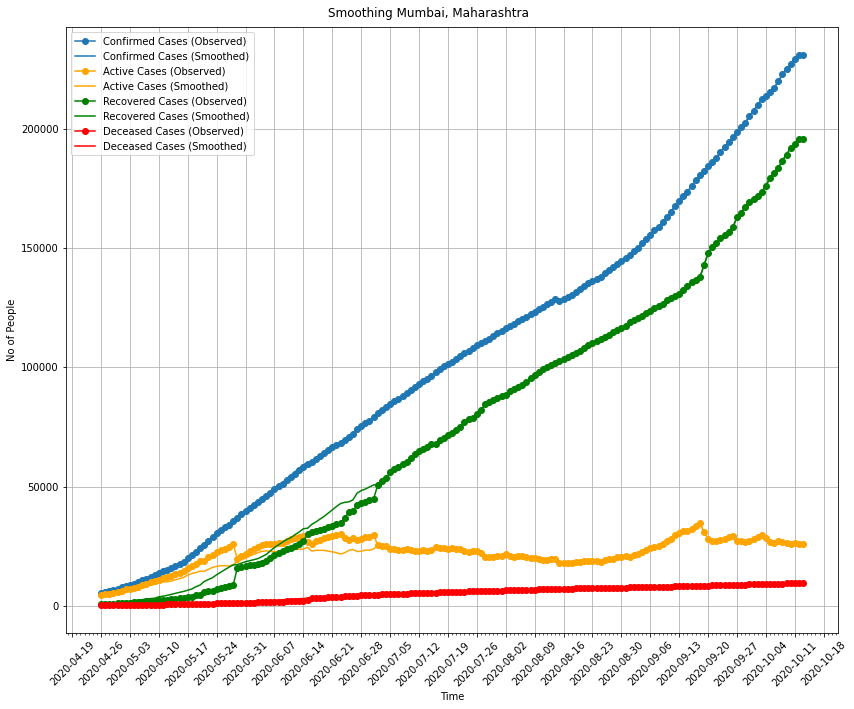

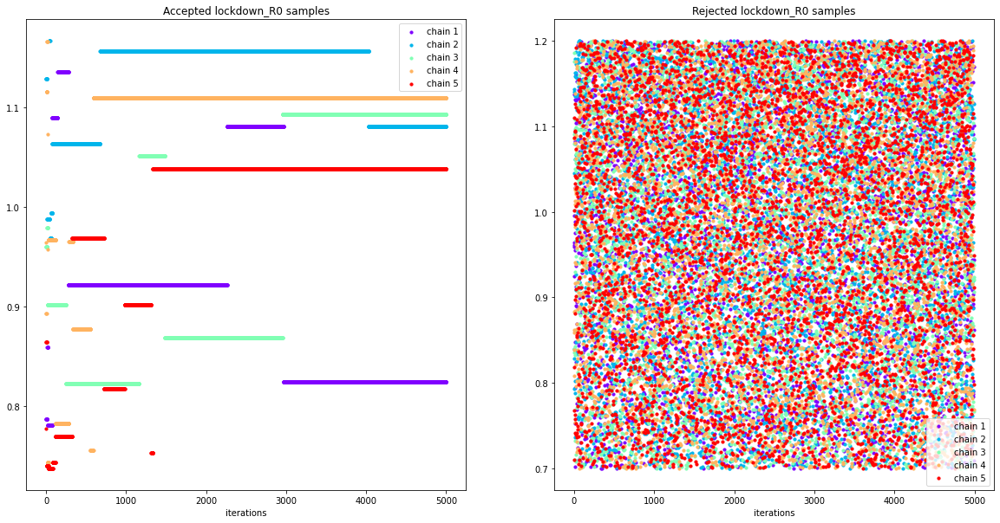

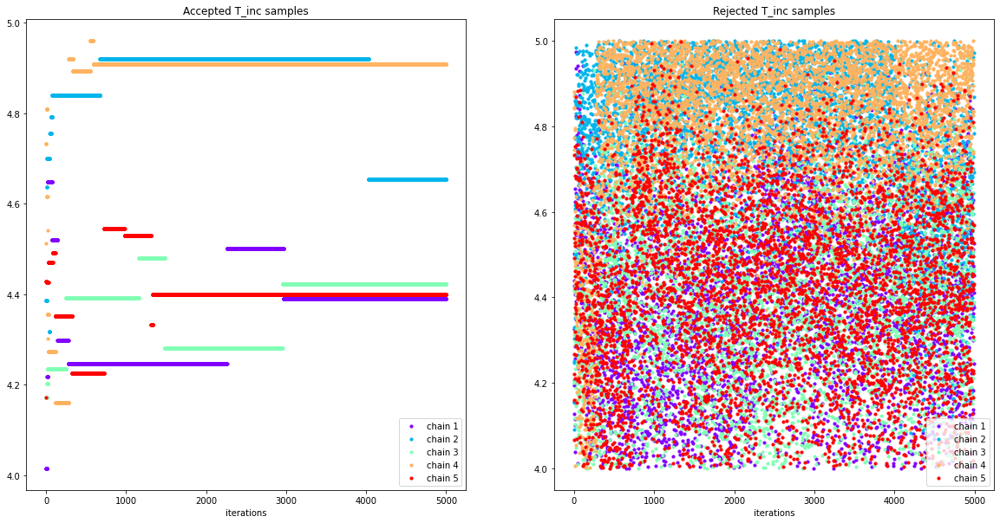

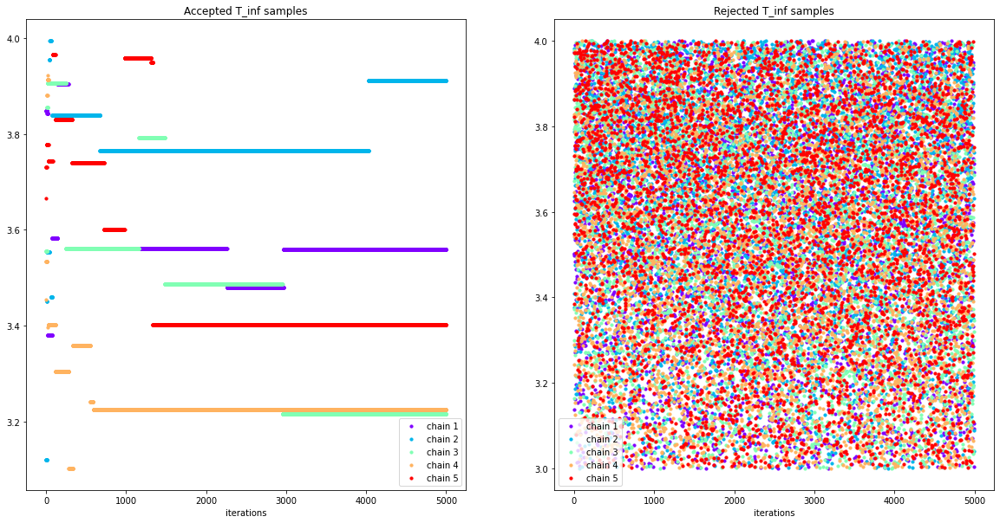

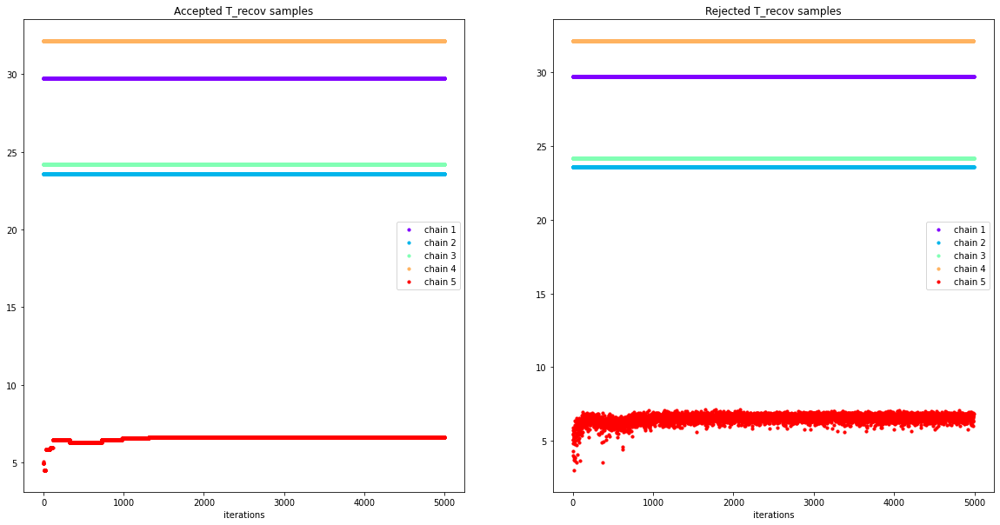

...

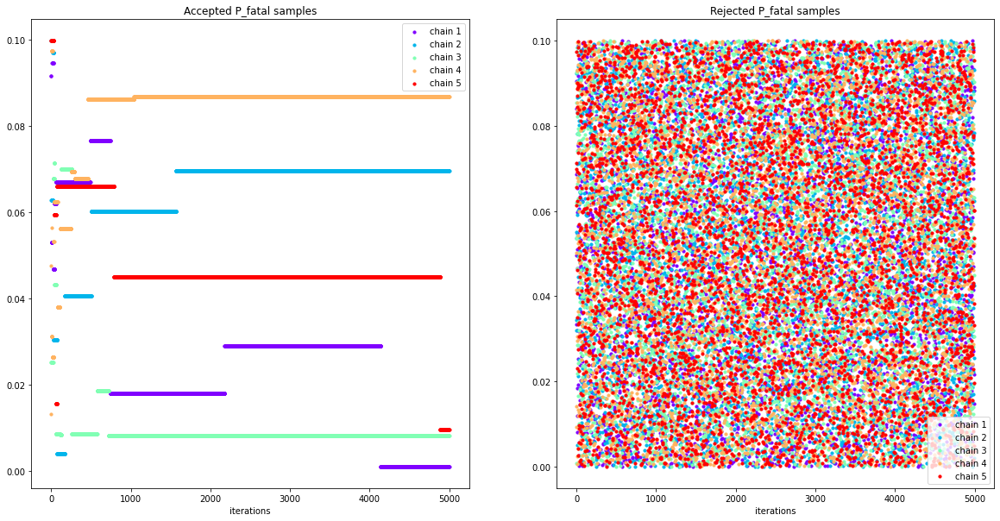

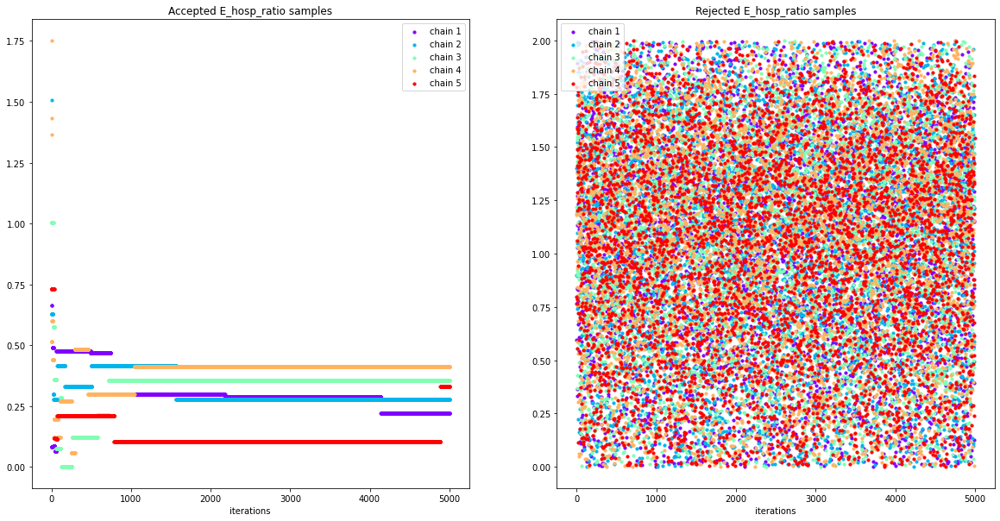

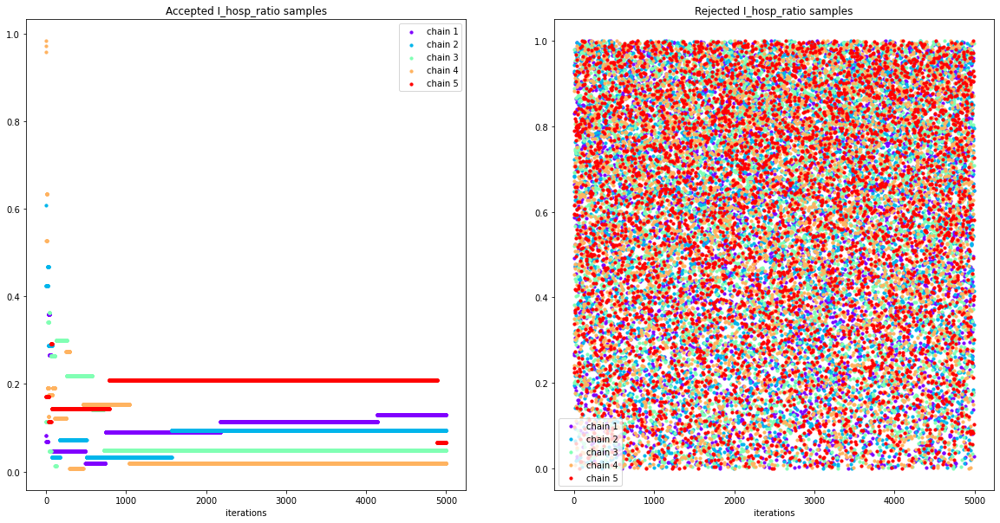

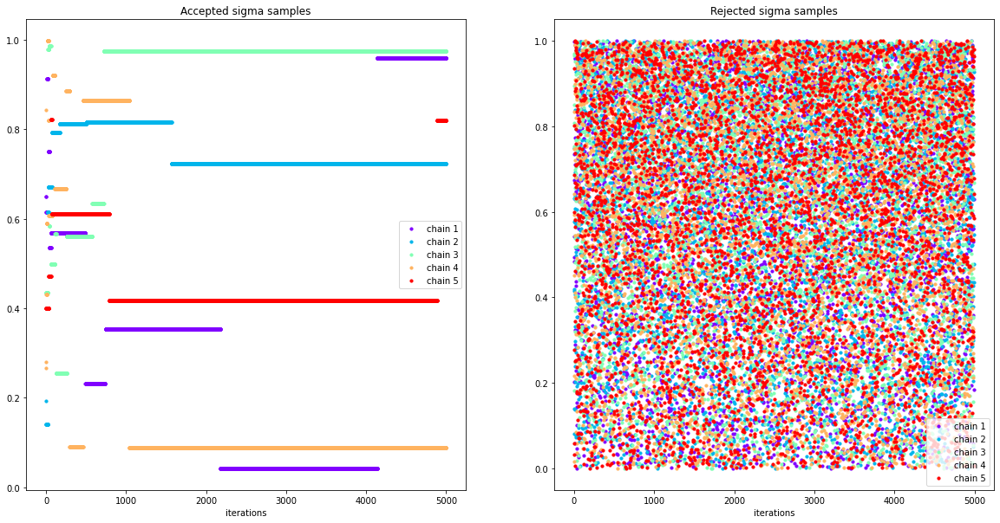

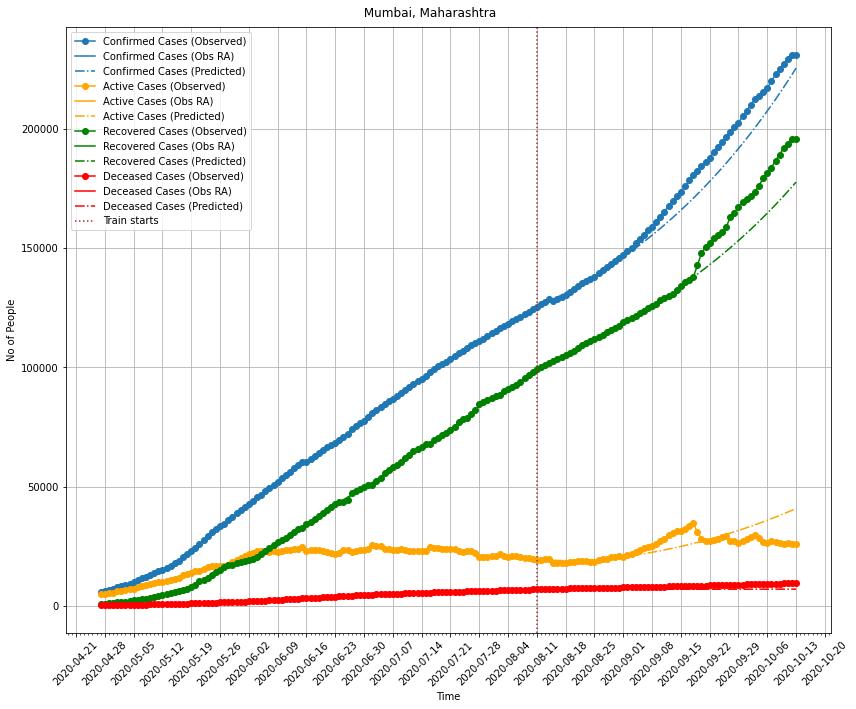

In [6]:
predictions_dict['m1'] = single_fitting_cycle(**copy.deepcopy(config['fitting'])) 

m2_params = copy.deepcopy(config['fitting'])
m2_params['split']['val_period'] = 0
predictions_dict['m2'] = single_fitting_cycle(**m2_params)

predictions_dict['fitting_date'] = datetime.datetime.now().strftime("%Y-%m-%d")

In [ ]:
predictions_dict['m1']['best_params']
plt.scatter(list(range(len(samples))), samples, s=10, c=color[i].reshape(1,-1), label='chain {}'.format(i+1))


In [7]:
predictions_dict['m2']['best_params']

OrderedDict([('lockdown_R0', 1.1854491940293843),
             ('T_inc', 4.6455267994334255),
             ('T_inf', 3.504065579406916),
             ('T_recov', 20.543911918924845),
             ('T_recov_fatal', 8.477946073931328),
             ('P_fatal', 0.0009830260003989638),
             ('E_hosp_ratio', 0.21912748684890332),
             ('I_hosp_ratio', 0.12933542362352338),
             ('sigma', 0.9594125294284093)])

## Loss Dataframes

### M1 Loss DataFrame

In [8]:
predictions_dict['m1']['df_loss']

,train,val
total,0.661036,4.1814
active,15.8955,6.4772
recovered,2.97759,5.24411
deceased,6.36108,12.7889


### M2 Loss DataFrame

In [9]:
predictions_dict['m2']['df_loss']

,train
total,0.391416
active,2.9786
recovered,0.175088
deceased,5.45993


## Sensitivity Plot

In [ ]:
predictions_dict['m1']['plots']['sensitivity'], _, _ = calculate_sensitivity_and_plot(predictions_dict, config, which_fit='m1')
predictions_dict['m2']['plots']['sensitivity'], _, _ = calculate_sensitivity_and_plot(predictions_dict, config, which_fit='m2')

## Plot Forecasts

In [ ]:
predictions_dict['m2']['forecasts'] = {}
predictions_dict['m2']['forecasts']['best'] = get_forecast(predictions_dict, train_fit='m2', 
                                                           model=config['fitting']['model'], 
                                                           days=config['forecast']['forecast_days'])

predictions_dict['m2']['plots']['forecast_best'] = plot_forecast(predictions_dict, 
                                                                 (config['fitting']['data']['dataloading_params']['state'], 
                                                                  config['fitting']['data']['dataloading_params']['district']), 
                                                                 error_bars=True)

predictions_dict['m1']['trials_processed'] = forecast_all_trials(predictions_dict, train_fit='m1', 
                                                                 model=config['fitting']['model'], 
                                                                 forecast_days=config['forecast']['forecast_days'])

predictions_dict['m2']['trials_processed'] = forecast_all_trials(predictions_dict, train_fit='m2', 
                                                                 model=config['fitting']['model'], 
                                                                 forecast_days=config['forecast']['forecast_days'])

kforecasts = plot_top_k_trials(predictions_dict, train_fit='m2',
                               k=config['forecast']['num_trials_to_plot'],
                               which_compartments=config['forecast']['plot_topk_trials_for_columns'])
                               
predictions_dict['m2']['plots']['forecasts_topk'] = {}
for column in config['forecast']['plot_topk_trials_for_columns']:
    predictions_dict['m2']['plots']['forecasts_topk'][column.name] = kforecasts[column]

## Uncertainty + Uncertainty Forecasts

In [ ]:
uncertainty_args = {'predictions_dict': predictions_dict, **config['uncertainty']['uncertainty_params']}
uncertainty = config['uncertainty']['method'](**uncertainty_args)

In [ ]:
uncertainty.beta_loss

In [ ]:
uncertainty_forecasts = uncertainty.get_forecasts()
for key in uncertainty_forecasts.keys():
    predictions_dict['m2']['forecasts'][key] = uncertainty_forecasts[key]['df_prediction']
    
predictions_dict['m2']['forecasts']['ensemble_mean'] = uncertainty.ensemble_mean_forecast

In [ ]:
predictions_dict['m2']['beta'] = uncertainty.beta
predictions_dict['m2']['beta_loss'] = uncertainty.beta_loss
predictions_dict['m2']['deciles'] = uncertainty_forecasts

In [ ]:
predictions_dict['m2']['plots']['forecast_best_50'] = plot_forecast(predictions_dict, 
                                                                    (config['fitting']['data']['dataloading_params']['state'], 
                                                                     config['fitting']['data']['dataloading_params']['district']),
                                                                    fits_to_plot=['best', 50], error_bars=False)
predictions_dict['m2']['plots']['forecast_best_80'] = plot_forecast(predictions_dict, 
                                                                    (config['fitting']['data']['dataloading_params']['state'], 
                                                                     config['fitting']['data']['dataloading_params']['district']),
                                                                    fits_to_plot=['best', 80], error_bars=False)
predictions_dict['m2']['plots']['forecast_ensemble_mean_50'] = plot_forecast(predictions_dict, 
                                                                             (config['fitting']['data']['dataloading_params']['state'], 
                                                                              config['fitting']['data']['dataloading_params']['district']),
                                                                             fits_to_plot=['ensemble_mean', 50], error_bars=False)

In [ ]:
ptiles_plots = plot_ptiles(predictions_dict, which_compartments=config['forecast']['plot_ptiles_for_columns'])
predictions_dict['m2']['plots']['forecasts_ptiles'] = {}
for column in config['forecast']['plot_ptiles_for_columns']:
    predictions_dict['m2']['plots']['forecasts_ptiles'][column.name] = ptiles_plots[column]

## Create Report

In [ ]:
save_dict_and_create_report(predictions_dict, config, ROOT_DIR=output_folder, config_filename=config_filename)

## Create Output

In [ ]:
df_output = create_decile_csv_new(predictions_dict)
df_output.to_csv(f'{output_folder}/deciles.csv')

In [ ]:
log_wandb(predictions_dict)

## Create All Trials Output

In [ ]:
df_all = create_all_trials_csv(predictions_dict)
df_all.to_csv(f'{output_folder}/all_trials.csv')